# **BA820 Airbnb California Market Segmentation & Housing Information Analysis**

B1 - Team 9

Team member: Lifu Li, Wenxin Liang, Yu Xu, Dizhao Zhang, Huawan Zhong

## **Text Cleaning**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
file_path="/content/drive/MyDrive/BA820/data/data_cleaned.csv"
data_cleaned=pd.read_csv(file_path)

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
data_cleaned.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,property_category,property_type_numeric,room_type_numeric,percentage,percentage_room_type
0,6,https://www.airbnb.com/rooms/6,20240921043845,2024-09-21,city scrape,North Park Craftsmen House * Great for Families,This Beautiful Craftsmen house has all the mod...,"We have the best Neighborhood in San Diego, in...",https://a0.muscache.com/pictures/miso/Hosting-...,29,https://www.airbnb.com/users/show/29,Sara,2008-03-03,"San Diego, CA",I am a San Diego based Entrepreneur with a lov...,within an hour,100.000000,92.000000,f,https://a0.muscache.com/im/pictures/user/User/...,https://a0.muscache.com/im/pictures/user/User/...,North Park,1.0,1.0,"['email', 'phone']",t,t,Neighborhood highlights,North Hills,NaN,32.75522,-117.12873,Entire home,Entire home/apt,8,2.0,2 baths,3.0,6.0,"[""Private backyard \u2013 Fully fenced"", ""Ceil...",249.0,1,30,1.0,2.0,30.0,30.0,1.3,30.0,NaN,t,12,12,12,30,2024-09-21,162,9,0,2008-06-22,2024-08-18,4.80,4.83,4.70,4.99,4.97,4.79,4.80,"STR-04545L, 631067",f,1,1,0,0,0.82,Standalone Homes,0,0,57.625594,73.101686
1,109,https://www.airbnb.com/rooms/109,20240904164210,2024-09-05,city scrape,Amazing bright elegant condo park front *UPGRA...,"*** Unit upgraded with new bamboo flooring, ne...",NaN,https://a0.muscache.com/pictures/miso/Hosting-...,521,https://www.airbnb.com/users/show/521,Paolo,2008-06-27,"San Francisco, CA","Husband, father, MIT MBA, Silicon Valley-based...",NaN,95.873592,87.789348,f,https://a0.muscache.com/im/pictures/user/User-...,https://a0.muscache.com/im/pictures/user/User-...,Culver City,1.0,3.0,"['email', 'phone']",t,t,NaN,Culver City,Other Cities,33.98301,-118.38607,Entire condo,Entire home/apt,6,2.0,2 baths,2.0,2.0,"[""Gym"", ""Pool view"", ""Kitchen"", ""Carbon monoxi...",129.0,30,730,30.0,30.0,730.0,730.0,30.0,730.0,NaN,t,0,0,0,82,2024-09-05,2,0,0,2011-08-15,2016-05-15,4.00,5.00,5.00,3.00,4.00,5.00,4.00,NaN,f,1,1,0,0,0.01,Apartments & Condos,1,0,7.187528,73.101686
2,958,https://www.airbnb.com/rooms/958,20240904163718,2024-09-04,city scrape,"Bright, Modern Garden Unit - 1BR/1BTH",Our bright garden unit overlooks a lovely back...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, CA",We are a family of four that live upstairs. W...,within an hour,100.000000,100.000000,t,https://a0.muscache.com/im/pictures/user/efdad...,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1.0,1.0,"['email', 'phone']",t,t,Neighborhood highlights,Western Addition,NaN,37.77028,-122.43317,Entire serviced apartment,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Free washer \u2013 In buil

In [5]:
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45583 entries, 0 to 45582
Data columns (total 80 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            45583 non-null  int64  
 1   listing_url                                   45583 non-null  object 
 2   scrape_id                                     45583 non-null  int64  
 3   last_scraped                                  45583 non-null  object 
 4   source                                        45583 non-null  object 
 5   name                                          45583 non-null  object 
 6   description                                   44701 non-null  object 
 7   neighborhood_overview                         27362 non-null  object 
 8   picture_url                                   45583 non-null  object 
 9   host_id                                       45583 non-null 

In [6]:
# check the null in 'description' column
data_cleaned['description'].isnull().sum()

882

In [7]:
data_cleaned.shape

(45583, 80)

In [8]:
# change the index into 'id'
data_cleaned.index = data_cleaned['id']

In [9]:
data_decription = data_cleaned['description'].dropna()
data_decription = pd.DataFrame(data_decription)
data_decription.head()

,description
id,
6,This Beautiful Craftsmen house has all the mod...
109,"*** Unit upgraded with new bamboo flooring, ne..."
958,Our bright garden unit overlooks a lovely back...
2708,"Run Runyon Canyon, Our Gym & Sauna Open <br />..."
2732,An oasis of tranquility awaits you.


In [10]:
df_decribe = data_decription.copy()

df_decribe["description"] = df_decribe["description"].str.lower()  # Convert to lowercase
df_decribe["description"] = df_decribe["description"].str.replace(r'<br\s*/?>', ' ', regex=True)  # Remove <br /> tags

df_decribe["description"] = df_decribe["description"].str.strip()  # Remove leading/trailing spaces
#df_decribe["description"] = df_decribe["description"].str.replace("like", "enjoy")  # Replace synonyms
df_decribe["description"] = df_decribe["description"].str.replace(r'[^\w\s]', '', regex=True)  # Remove punctuation

df_decribe["description"] = df_decribe["description"].str.replace(r'\d+', '', regex=True)  # Remove numbers (NOT SURE NEED OR NOT)
df_decribe['description'] = df_decribe['description'].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)  # Remove special characters

df_decribe

,description
id,
6,this beautiful craftsmen house has all the mod...
109,unit upgraded with new bamboo flooring new ul...
958,our bright garden unit overlooks a lovely back...
2708,run runyon canyon our gym sauna open beauti...
2732,an oasis of tranquility awaits you
...,...
1244362166123044607,l full size bed room in n san jose near sj air...
1244898988351466083,a newly renovated studio in a luxury historic ...
1244936374575241213,light filled spacious bed bath apartment in ...


In [11]:
!pip install langdetect
!pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=c7e7cfe521f222c8228a7008eef6da16c9b0a15942c07d87f4ddc9c888910330
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 6.7 MB/s eta 0:00:00


In [12]:
import emoji

def remove_all_emojis(text):
    if isinstance(text, str):  # Only process if it's a string
        return emoji.replace_emoji(text, replace='')  # Removes all emojis
    return ""  # Return empty string if not a string (e.g., NaN or numbers)

# Ensure all descriptions are strings
df_decribe["description"] = df_decribe["description"].astype(str).fillna("")

# Apply the function
df_decribe["description"] = df_decribe["description"].apply(remove_all_emojis)


In [13]:
df_decribe.shape

(44701, 1)

In [14]:
df_decribe.iloc[19614, 0] # check emoji deleted or not

'if you are looking for a home to rest and very convenient location look no further our home is a beautiful clean spacious home for our airbnb guest  located minutes away from av mall restaurants and highway also close by lockheed martin northrop grumman and palmdale regional hospital  i live very close by and i am available for any questions or requests you may have'

## **Tokenization**

In [15]:
!pip install nltk

In [16]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [17]:
from nltk.tokenize import word_tokenize, sent_tokenize, WhitespaceTokenizer, RegexpTokenizer
from nltk.tokenize.casual import TweetTokenizer
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords


# Keep all description are strings & replace NA with empty string:
df_decribe["description"] = df_decribe["description"].astype(str).fillna("")

description = df_decribe["description"].tolist()

tokenized = [word_tokenize(t) for t in description] # word tokenization
# tokenized = [WhitespaceTokenizer().tokenize(t) for t in corpus] # based on white spaces.
# tokenized = [TweetTokenizer().tokenize(t) for t in corpus] #Tweets tokenization
# tokenized = [RegexpTokenizer(r'\d{4}|\d{3}', gaps=False).tokenize(t) for t in corpus] # '-[0-9]{3}-[0-9]{4}' #'\d{4}|\d{3}' # Regex tokenization. This keeps phone numbers only
tokenized
stop_words = set(stopwords.words('english')) # Get the set of stop words
remove_keywords = {"san", "francisco", "diego", "los", "angeles"} # remove some words
tokenized_filtered = []
for tokenized_sentence in tokenized:
    filtered_sentence = [word for word in tokenized_sentence
                         if word.lower() not in stop_words and
                         not any(remove_word in word.lower() for remove_word in remove_keywords)]  # Remove partial matches
    tokenized_filtered.append(filtered_sentence)

tokenized_filtered

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


[['beautiful',
  'craftsmen',
  'house',
  'modern',
  'conveniences',
  'whole',
  'family',
  'enjoy',
  'craftsmen',
  'feel',
  'heart',
  'walking',
  'distance',
  'local',
  'restaurants',
  'bars',
  'breweries',
  'booming',
  'neighborhood',
  'north',
  'park',
  'home',
  'also',
  'great',
  'families',
  'ps',
  'might',
  'seen',
  'listing',
  'home',
  'first',
  'ever',
  'full',
  'property',
  'listed',
  'airbnb',
  'read',
  'full',
  'story',
  'come',
  'stay',
  'questions',
  'reach'],
 ['unit',
  'upgraded',
  'new',
  'bamboo',
  'flooring',
  'new',
  'ultra',
  'hd',
  'sony',
  'tv',
  'new',
  'paint',
  'new',
  'lighting',
  'new',
  'mattresses',
  'ultra',
  'fast',
  'cable',
  'internet',
  'connection',
  'apple',
  'tv',
  'chromecast',
  'gorgeous',
  'elegant',
  'furnished',
  'condo',
  'front',
  'culver',
  'city',
  'fox',
  'hills',
  'park',
  'upper',
  'corner',
  'unit',
  'total',
  'silence',
  'protected',
  'trees',
  'short',
  '

In [18]:
# Try to use the stemming
from nltk.stem import PorterStemmer

ps = PorterStemmer()

tokenized_filtered_stemmed = []
for tokenized_sentence in tokenized_filtered:
  tokenized_filtered_stemmed.append([ps.stem(word) for word in tokenized_sentence])

tokenized_filtered_stemmed

[['beauti',
  'craftsmen',
  'hous',
  'modern',
  'conveni',
  'whole',
  'famili',
  'enjoy',
  'craftsmen',
  'feel',
  'heart',
  'walk',
  'distanc',
  'local',
  'restaur',
  'bar',
  'breweri',
  'boom',
  'neighborhood',
  'north',
  'park',
  'home',
  'also',
  'great',
  'famili',
  'ps',
  'might',
  'seen',
  'list',
  'home',
  'first',
  'ever',
  'full',
  'properti',
  'list',
  'airbnb',
  'read',
  'full',
  'stori',
  'come',
  'stay',
  'question',
  'reach'],
 ['unit',
  'upgrad',
  'new',
  'bamboo',
  'floor',
  'new',
  'ultra',
  'hd',
  'soni',
  'tv',
  'new',
  'paint',
  'new',
  'light',
  'new',
  'mattress',
  'ultra',
  'fast',
  'cabl',
  'internet',
  'connect',
  'appl',
  'tv',
  'chromecast',
  'gorgeou',
  'eleg',
  'furnish',
  'condo',
  'front',
  'culver',
  'citi',
  'fox',
  'hill',
  'park',
  'upper',
  'corner',
  'unit',
  'total',
  'silenc',
  'protect',
  'tree',
  'short',
  'walk',
  'new',
  'westfield',
  'mall',
  'tenni',
  'co

In [19]:
from collections import Counter

# convert list of lists into a single list
word_counts = Counter(word for sentence in tokenized_filtered_stemmed for word in sentence)

word_counts

Counter({'beauti': 8336,
         'craftsmen': 9,
         'hous': 11642,
         'modern': 6481,
         'conveni': 6235,
         'whole': 1996,
         'famili': 7117,
         'enjoy': 12173,
         'feel': 2271,
         'heart': 6397,
         'walk': 15684,
         'distanc': 6460,
         'local': 2321,
         'restaur': 12050,
         'bar': 3312,
         'breweri': 396,
         'boom': 17,
         'neighborhood': 7638,
         'north': 1390,
         'park': 19670,
         'home': 21253,
         'also': 3223,
         'great': 5789,
         'ps': 33,
         'might': 201,
         'seen': 54,
         'list': 1479,
         'first': 811,
         'ever': 121,
         'full': 6172,
         'properti': 3422,
         'airbnb': 1201,
         'read': 854,
         'stori': 969,
         'come': 2916,
         'stay': 10855,
         'question': 277,
         'reach': 362,
         'unit': 6298,
         'upgrad': 555,
         'new': 6441,
         'bamboo': 

## **Vectorization (TF-IDF)**

In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [21]:
# Convert tokenized & stemmed lists back to string format
df_decribe["processed_description"] = [" ".join(sentence) for sentence in tokenized_filtered_stemmed]
max_features=5000 # We tried multiple options between [1000,5000,10000] and the result didn't change

# Initialize TF-IDF vectorizer with stopword removal
tfidf_model = TfidfVectorizer(norm=None, max_features=max_features, stop_words='english')

# Fit and transform the processed descriptions
df_tfidf_transformed = tfidf_model.fit_transform(df_decribe["processed_description"])

# Convert to DataFrame
tfidf_vectors = pd.DataFrame(df_tfidf_transformed.toarray(), columns=tfidf_model.get_feature_names_out())

# Display the resulting TF-IDF matrix
tfidf_vectors

aa  abbot  abbott  abc  abid  abil  abl  abod  abound  abroad  \
0      0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
1      0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
2      0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
3      0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
4      0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
...    ...    ...     ...  ...   ...   ...  ...   ...     ...     ...   
44696  0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
44697  0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
44698  0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
44699  0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   
44700  0.0    0.0     0.0  0.0   0.0   0.0  0.0   0.0     0.0     0.0   

       absolut  abstract  abund        ac  academ  academi  accent  accentu  \
0          0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
1          0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
2          0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
3          0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
4          0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
...        ...       ...    ...       ...     ...      ...     ...      ...   
44696      0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
44697      0.0       0.0    0.0  4.045776     0.0      0.0     0.0      0.0   
44698      0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
44699      0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   
44700      0.0       0.0    0.0  0.000000     0.0      0.0     0.0      0.0   

       accept  access  accessori  acclaim  accommod  accomod  accompani  \
0         0.0     0.0        0.0      0.0       0.0      0.0        0.0   
1         0.0     0.0        0.0      0.0       0.0      0.0        0.0   
2         0.0     0.0        0.0      0.0       0.0      0.0        0.0   
3         0.0     0.0        0.0      0.0       0.0      0.0        0.0   
4         0.0     0.0        0.0      0.0       0.0      0.0        0.0   
...       ...     ...        ...      ...       ...      ...        ...   
44696     0.0     0.0        0.0      0.0       0.0      0.0        0.0   
44697     0.0     0.0        0.0      0.0       0.0      0.0        0.0   
44698     0.0     0.0        0.0      0.0       0.0      0.0        0.0   
44699     0.0     0.0        0.0      0.0       0.0      0.0        0.0   
44700     0.0     0.0        0.0      0.0       0.0      0.0        0.0   

       accord  account  accur  ace  acheat  achiev  acquir  acr  act  action  \
0         0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
1         0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
2         0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
3         0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
4         0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
...       ...      ...    ...  ...     ...     ...     ...  ...  ...     ...   
44696     0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
44697     0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
44698     0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
44699     0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   
44700     0.0      0.0    0.0  0.0     0.0     0.0     0.0  0.0  0.0     0.0   

       activ  actor  actual   ad  ada  adam  adapt  add  addison  addit  addl  \
0        0.0    0.0     0.0  0.0  0.0   0.0    0.0  0.0      0.0    0.0   0.0   
1        0.0    0.0     0.0  0.0  0.0   0.0    0.0  0.0      0.0    0.0   0.0   
2        0.0    0.0     0.0  0.0  0.0   0.0    0.0  0.0      0.0    0.0   0.0

## **Topic Modelling**

In [22]:
!pip install mglearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 581.4/581.4 kB 6.7 MB/s eta 0:00:00


In [23]:
from sklearn.decomposition import NMF
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora

In [24]:
# Discover the proper amount of topics based on Coherence Score
id2word = corpora.Dictionary(tokenized_filtered_stemmed)
corpus = [id2word.doc2bow(text) for text in tokenized_filtered_stemmed]

coherence_scores = []
n_topic_range = range(2, 11)

for n in n_topic_range:
    nmf_model = NMF(n_components=n, random_state=42)
    W = nmf_model.fit_transform(tfidf_vectors)
    H = nmf_model.components_

    top_n_words = 10
    topic_words = []
    for topic in H:
        top_words = [tfidf_model.get_feature_names_out()[i] for i in topic.argsort()[-top_n_words:]]
        topic_words.append(top_words)

    coherence_model = CoherenceModel(topics=topic_words, texts=tokenized_filtered_stemmed, dictionary=id2word, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

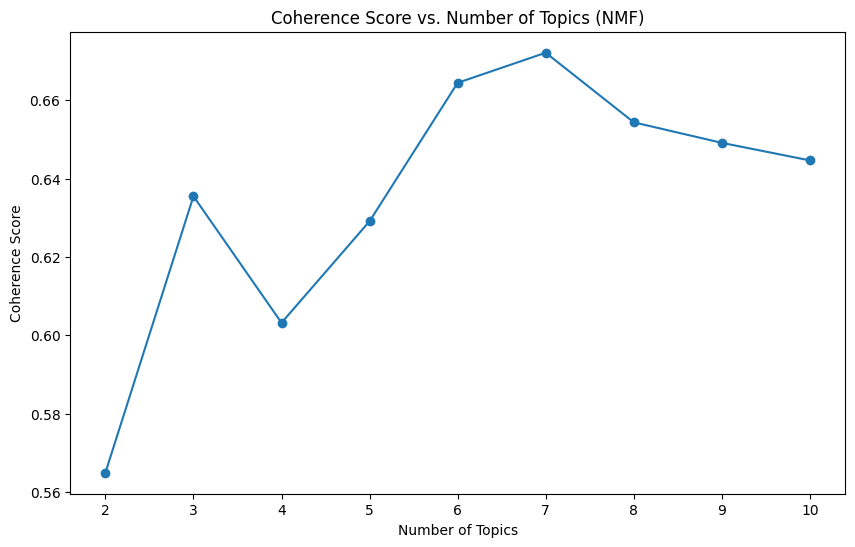

In [25]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(n_topic_range, coherence_scores, marker='o')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Coherence Score vs. Number of Topics (NMF)')
plt.show()

In [26]:
n_components = 7 # Based on the best result above
model = NMF(n_components=n_components, random_state=42)
W = model.fit_transform(tfidf_vectors)

In [27]:
import mglearn
import numpy as np
feature_names=tfidf_vectors.columns
mglearn.tools.print_topics(topics=range(n_components), feature_names=tfidf_vectors.columns,
                           sorting=np.argsort(model.components_, axis=1)[:, ::-1], n_words=10, topics_per_chunk=1)

topic 0       
--------      
home          
perfect       
stay          
comfort       
offer         
enjoy         
welcom        
relax         
modern        
famili        


topic 1       
--------      
min           
drive         
lax           
airport       
disneyland    
downtown      
walk          
univers       
stadium       
la            


topic 2       
--------      
room          
bed           
privat        
bedroom       
bathroom      
kitchen       
tv            
queen         
live          
larg          


topic 3       
--------      
minut         
park          
walk          
restaur       
shop          
locat         
downtown      
center        
distanc       
drive         


topic 4       
--------      
beach         
ocean         
view          
pacif         
mission       
bay           
venic         
block         
step          
walk          


topic 5       
--------      
mile          
lax           
airport       
away          


Topic 0:
Topic 1:
Topic 2:
Topic 3:
Topic 4:
Topic 5:
Topic 6:


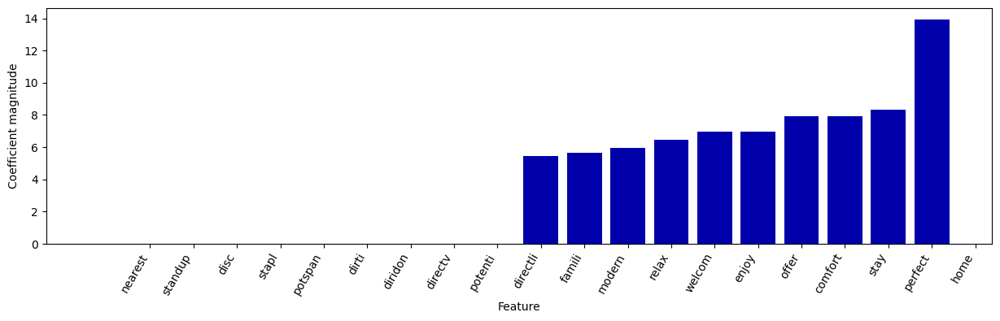

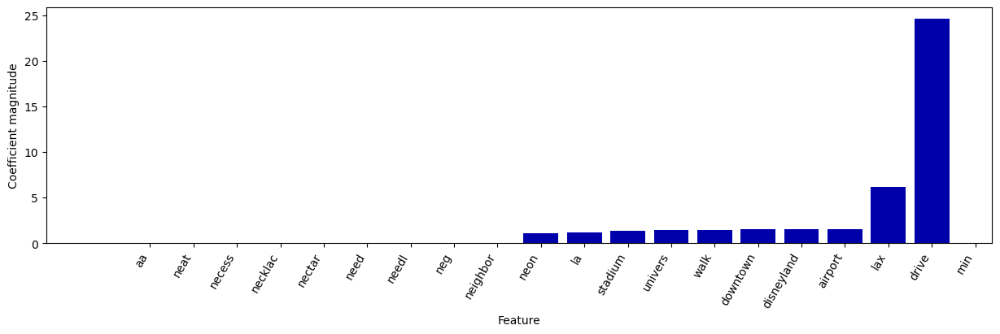

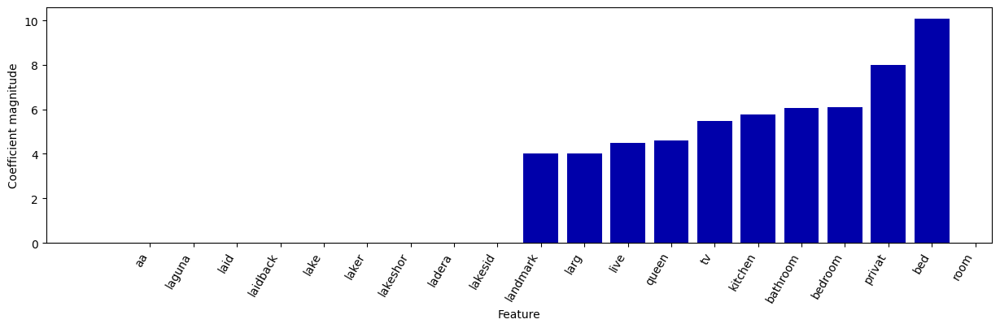

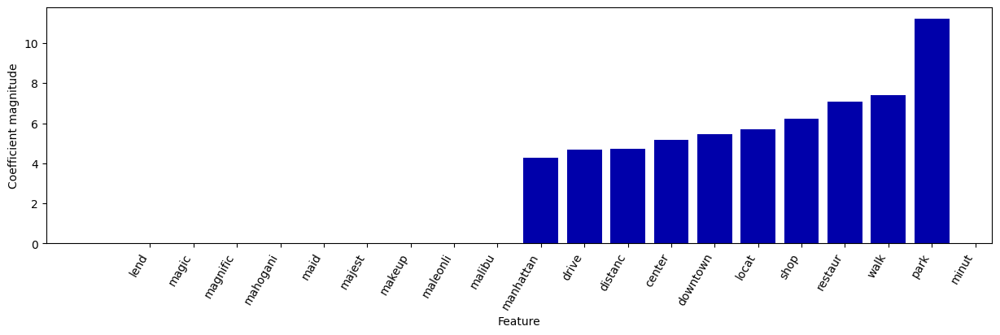

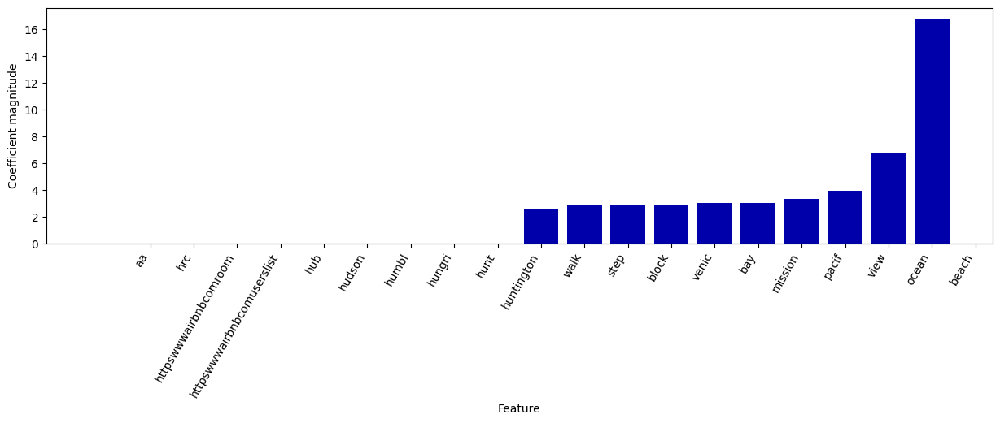

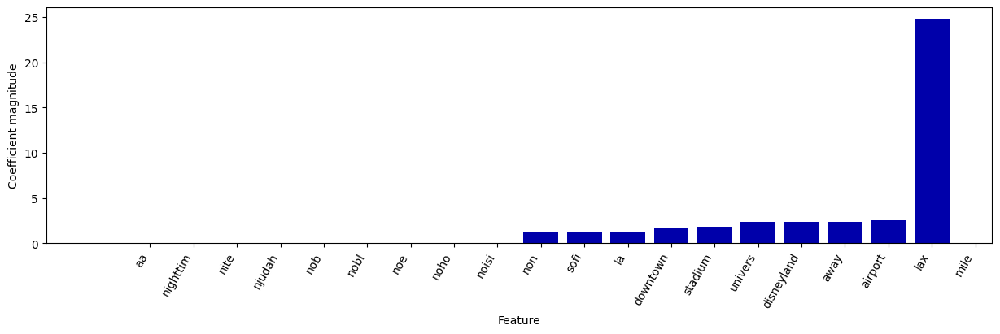

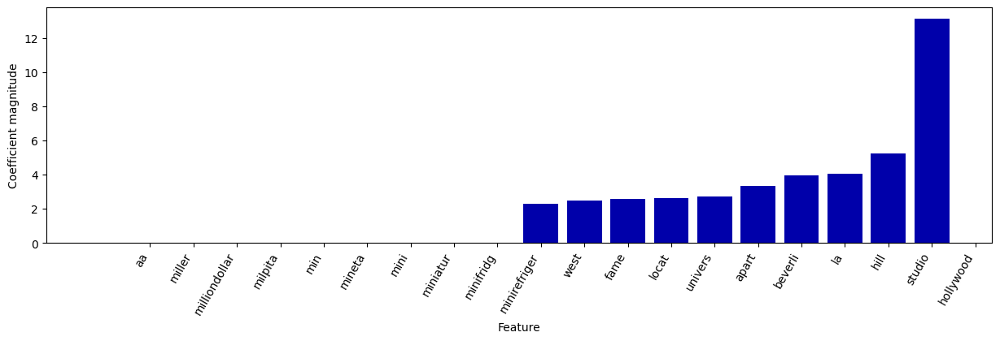

In [28]:
for i in range(n_components):
  print(f"Topic {i}:")
  mglearn.tools.visualize_coefficients(model.components_[i], feature_names, n_top_features=10)

In [29]:
# Name the topics based on interpretation
topics = ['Cozy Stay', 'Travel Access', 'Room Amenities',
          'Nearby Convenience', 'Beach Proximity', 'Landmark Access', 'Hollywood Experience']

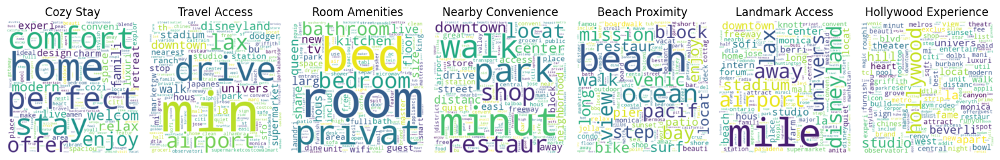

In [30]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

topics = ['Cozy Stay', 'Travel Access', 'Room Amenities',
          'Nearby Convenience', 'Beach Proximity', 'Landmark Access', 'Hollywood Experience']

fig, axes = plt.subplots(1, n_components, figsize=(15, 5))
if n_components == 1:
    axes = [axes]

for i, ax in enumerate(axes):
    topic_words = model.components_[i]
    word_freq = {feature_names[j]: topic_words[j] for j in range(len(feature_names))}

    wordcloud = WordCloud(width=400, height=400, background_color='white', colormap='viridis').generate_from_frequencies(word_freq)

    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(topics[i])
    ax.axis("off")

plt.tight_layout()
plt.show()


In [31]:
topic_df = pd.DataFrame(W, columns=[f'topic_{i}' for i in range(n_components)])
topic_df.columns = topics
topic_df

,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
0,0.130236,0.000000,0.000000,0.123459,0.028631,0.000000,0.014657
1,0.000000,0.000000,0.238333,0.045689,0.035627,0.000000,0.159558
2,0.070378,0.000000,0.050322,0.064368,0.001592,0.000000,0.011330
3,0.022872,0.000000,0.065914,0.032375,0.042234,0.000000,0.052947
4,0.016901,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
44696,0.000000,0.009723,0.066485,0.068291,0.000000,0.029137,0.000000
44697,0.000000,0.000000,0.310483,0.036347,0.000000,0.000000,0.075108
44698,0.031525,0.000000,0.105910,0.012082,0.052760,0.000000,0.058535
44699,0.203287,0.000000,0.007202,0.000000,0.035032,0.004345,0.000000


In [32]:
topic_df.index = data_decription.index
topic_df

,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
id,,,,,,,
6,0.130236,0.000000,0.000000,0.123459,0.028631,0.000000,0.014657
109,0.000000,0.000000,0.238333,0.045689,0.035627,0.000000,0.159558
958,0.070378,0.000000,0.050322,0.064368,0.001592,0.000000,0.011330
2708,0.022872,0.000000,0.065914,0.032375,0.042234,0.000000,0.052947
2732,0.016901,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
1244362166123044607,0.000000,0.009723,0.066485,0.068291,0.000000,0.029137,0.000000
1244898988351466083,0.000000,0.000000,0.310483,0.036347,0.000000,0.000000,0.075108
1244936374575241213,0.031525,0.000000,0.105910,0.012082,0.052760,0.000000,0.058535


In [33]:
topic_df.describe()

,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
count,44701.000000,44701.000000,44701.000000,44701.000000,44701.000000,44701.000000,44701.000000
mean,0.061720,0.031239,0.092821,0.074285,0.064413,0.024641,0.050988
std,0.058617,0.110028,0.098621,0.080102,0.104690,0.092564,0.103262
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.013398,0.000000,0.007079,0.004366,0.000000,0.000000,0.000000
50%,0.046828,0.000000,0.064025,0.051243,0.013962,0.000000,0.006738
75%,0.095358,0.005529,0.147270,0.120243,0.084692,0.006920,0.052345
max,0.365119,1.797426,0.785892,0.788308,0.872984,2.814488,1.117918


In [34]:
df_describe_with_topics = data_decription.merge(topic_df, left_index=True, right_index=True)
df_describe_with_topics

,description,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
id,,,,,,,,
6,This Beautiful Craftsmen house has all the mod...,0.130236,0.000000,0.000000,0.123459,0.028631,0.000000,0.014657
109,"*** Unit upgraded with new bamboo flooring, ne...",0.000000,0.000000,0.238333,0.045689,0.035627,0.000000,0.159558
958,Our bright garden unit overlooks a lovely back...,0.070378,0.000000,0.050322,0.064368,0.001592,0.000000,0.011330
2708,"Run Runyon Canyon, Our Gym & Sauna Open <br />...",0.022872,0.000000,0.065914,0.032375,0.042234,0.000000,0.052947
2732,An oasis of tranquility awaits you.,0.016901,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
1244362166123044607,l Full Size bed<br />Room in N. San Jose near ...,0.000000,0.009723,0.066485,0.068291,0.000000,0.029137,0.000000
1244898988351466083,A Newly Renovated Studio in a luxury historic ...,0.000000,0.000000,0.310483,0.036347,0.000000,0.000000,0.075108
1244936374575241213,Light filled spacious 2 bed 2 bath apartment i...,0.031525,0.000000,0.105910,0.012082,0.052760,0.000000,0.058535


## **Try Clustering Based on Topics**

In [35]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Standardize the data
sc = StandardScaler()
data_normalized = sc.fit_transform(topic_df)
data_normalized

array([[ 1.16889045, -0.28391668, -0.94119653, ..., -0.34179561,
        -0.26621062, -0.35183976],
       [-1.05296115, -0.28391668,  1.4754772 , ..., -0.27496262,
        -0.26621062,  1.05141114],
       [ 0.14769983, -0.28391668, -0.43093622, ..., -0.60006889,
        -0.26621062, -0.38405452],
       ...,
       [-0.51513153, -0.28391668,  0.13271675, ..., -0.11130711,
        -0.26621062,  0.07308177],
       [ 2.41514645, -0.28391668, -0.86816795, ..., -0.28064761,
        -0.21926459, -0.49378035],
       [-0.01809781, -0.28391668,  0.57317771, ...,  0.78147318,
        -0.2424442 , -0.49378035]])

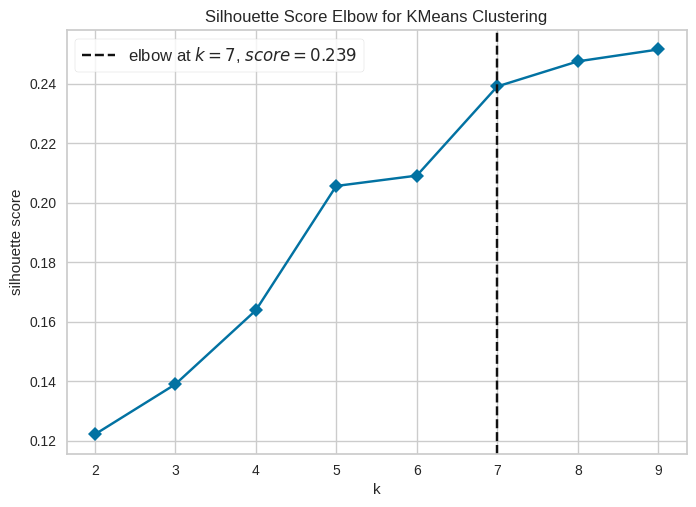

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [36]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans(random_state = 25)
visualizer = KElbowVisualizer(
    kmeans, k=(2,10), metric='silhouette', timings=False #metric='silhouette' metric='distortion'
)

visualizer.fit(data_normalized)        # Fit the data to the visualizer
visualizer.show()

/usr/local/lib/python3.11/dist-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/usr/local/lib/python3.11/dist-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


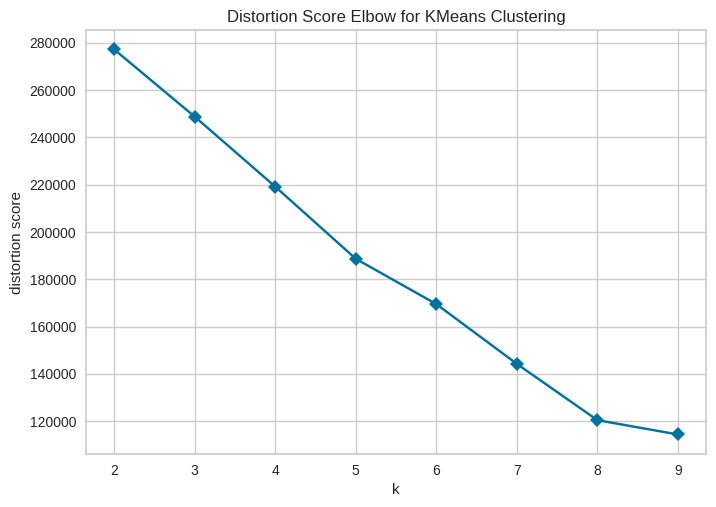

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [37]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans(random_state = 25)
visualizer = KElbowVisualizer(
    kmeans, k=(2,10), metric='distortion', timings=False #metric='silhouette' metric='distortion'
)

visualizer.fit(data_normalized)        # Fit the data to the visualizer
visualizer.show()

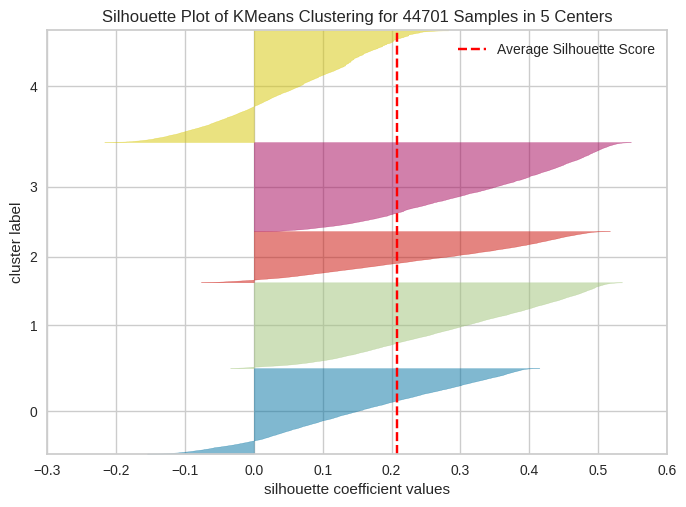

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 44701 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [38]:
from yellowbrick.cluster import SilhouetteVisualizer
kmeans = KMeans(5)

visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

visualizer.fit(data_normalized)        # Fit the data to the visualizer
visualizer.show()

In [39]:
import pandas as pd
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, fcluster

df_scores = pd.DataFrame(columns=['num_clusters', 'silhouette_score'])

In [40]:
Z =linkage(data_normalized, method = "single")

In [41]:
for num_cluster in range(2, 10):
  print("# cluster = ", num_cluster)
  labels = fcluster(Z, num_cluster, criterion='maxclust')
  score = silhouette_score(data_normalized, labels)

  df_scores = pd.concat([df_scores, pd.DataFrame([[num_cluster, score]], columns=['num_clusters', 'silhouette_score'])], ignore_index=True)

# cluster =  2


<ipython-input-41-97633f0c5cc3>:6: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_scores = pd.concat([df_scores, pd.DataFrame([[num_cluster, score]], columns=['num_clusters', 'silhouette_score'])], ignore_index=True)


# cluster =  3
# cluster =  4
# cluster =  5
# cluster =  6
# cluster =  7
# cluster =  8
# cluster =  9


<Axes: xlabel='num_clusters'>

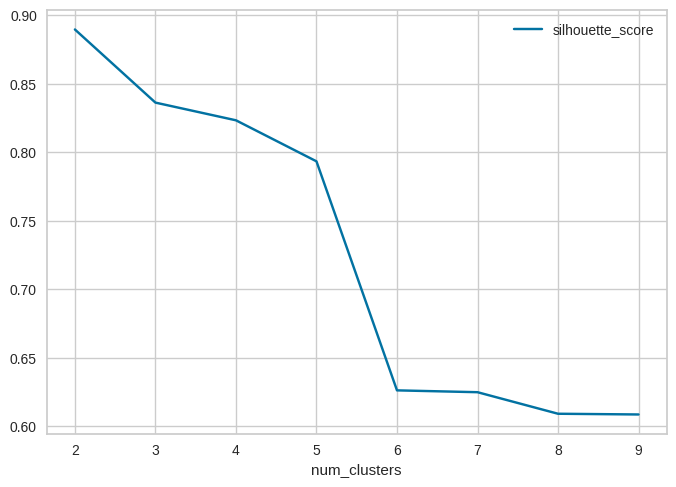

In [42]:
df_scores.plot.line(x='num_clusters', y='silhouette_score')

{'icoord': [[65.0, 65.0, 75.0, 75.0],
  [55.0, 55.0, 70.0, 70.0],
  [165.0, 165.0, 175.0, 175.0],
  [155.0, 155.0, 170.0, 170.0],
  [195.0, 195.0, 205.0, 205.0],
  [185.0, 185.0, 200.0, 200.0],
  [215.0, 215.0, 225.0, 225.0],
  [245.0, 245.0, 255.0, 255.0],
  [235.0, 235.0, 250.0, 250.0],
  [335.0, 335.0, 345.0, 345.0],
  [325.0, 325.0, 340.0, 340.0],
  [315.0, 315.0, 332.5, 332.5],
  [305.0, 305.0, 323.75, 323.75],
  [295.0, 295.0, 314.375, 314.375],
  [355.0, 355.0, 365.0, 365.0],
  [455.0, 455.0, 465.0, 465.0],
  [445.0, 445.0, 460.0, 460.0],
  [435.0, 435.0, 452.5, 452.5],
  [425.0, 425.0, 443.75, 443.75],
  [415.0, 415.0, 434.375, 434.375],
  [405.0, 405.0, 424.6875, 424.6875],
  [395.0, 395.0, 414.84375, 414.84375],
  [385.0, 385.0, 404.921875, 404.921875],
  [375.0, 375.0, 394.9609375, 394.9609375],
  [360.0, 360.0, 384.98046875, 384.98046875],
  [304.6875, 304.6875, 372.490234375, 372.490234375],
  [285.0, 285.0, 338.5888671875, 338.5888671875],
  [275.0, 275.0, 311.79443359375

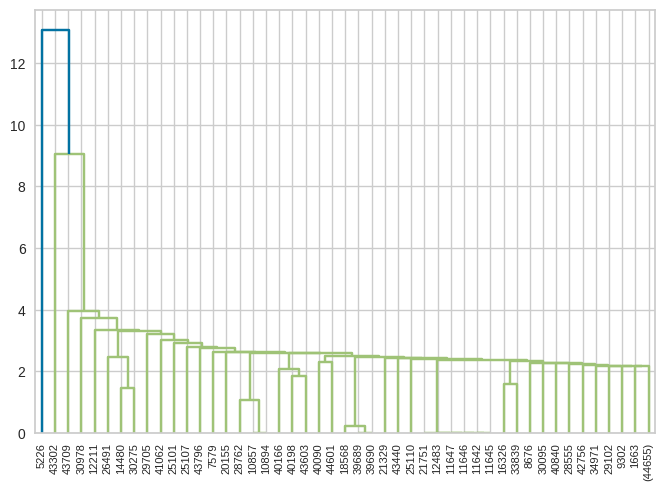

In [43]:
from scipy.cluster.hierarchy import dendrogram
dendrogram(Z, p = 30, truncate_mode = "level")

Based on the results above, the clusters were not great. So we gave up using topics as cluster factor.

## **Leveraging Topics to Validate the Interpretability of the Clusters**

In [44]:
sc = StandardScaler()
topic_normalized = sc.fit_transform(topic_df)
topic_normalized = pd.DataFrame(topic_normalized, columns=topic_df.columns)
topic_normalized.index = topic_df.index
topic_normalized

,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
id,,,,,,,
6,1.168890,-0.283917,-0.941197,0.613889,-0.341796,-0.266211,-0.351840
109,-1.052961,-0.283917,1.475477,-0.357001,-0.274963,-0.266211,1.051411
958,0.147700,-0.283917,-0.430936,-0.123803,-0.600069,-0.266211,-0.384055
2708,-0.662769,-0.283917,-0.272840,-0.523210,-0.211857,-0.266211,0.018965
2732,-0.764633,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
...,...,...,...,...,...,...,...
1244362166123044607,-1.052961,-0.195548,-0.267049,-0.074837,-0.615279,0.048570,-0.493780
1244898988351466083,-1.052961,-0.283917,2.207069,-0.473632,-0.615279,-0.266211,0.233582
1244936374575241213,-0.515132,-0.283917,0.132717,-0.776556,-0.111307,-0.266211,0.073082


In [45]:
# Bring in the original dataset with cluster label finished in M1
file_path="/content/drive/MyDrive/BA820/data/data_roomclass_k_with_id.csv"
cluster_result=pd.read_csv(file_path)

In [46]:
cluster_result

,host_response_rate,host_acceptance_rate,host_listings_count,property_type_numeric,room_type_numeric,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cluster_label,id
0,100.000000,92.000000,1.0,0.0,0.0,8,2.0,3.0,6.0,249.0,1,30,12,12,12,30,162,9,0,4.83,4.70,4.99,4.97,4.79,4.80,1,6
1,95.873592,87.789348,1.0,1.0,0.0,6,2.0,2.0,2.0,129.0,30,730,0,0,0,82,2,0,0,5.00,5.00,3.00,4.00,5.00,4.00,2,109
2,100.000000,100.000000,1.0,1.0,0.0,3,1.0,1.0,2.0,186.0,2,30,2,11,27,201,453,46,2,4.93,4.93,4.96,4.89,4.97,4.76,1,958
3,100.000000,100.000000,2.0,3.0,1.0,1,1.0,1.0,1.0,86.0,30,550,4,8,38,313,43,3,0,4.81,4.93,5.00,4.98,4.95,4.86,0,2708
4,100.000000,78.000000,2.0,3.0,1.0,1,1.0,1.0,1.0,139.0,7,27,24,54,84,326,24,0,0,4.26,4.58,4.39,4.48,4.91,4.22,1,2732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45578,100.000000,33.000000,1.0,3.0,1.0,1,1.0,1.0,1.0,39.0,1,365,16,45,75,350,1,1,1,5.00,5.00,4.00,5.00,5.00,5.00,0,1244362166123044607
45579,99.000000,99.000000,34.0,0.0,0.0,2,1.0,0.0,1.0,123.0,1,28,21,49,79,354,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,1,1244898988351466083
45580,100.000000,50.000000,2.0,0.0,0.0,5,1.5,2.0,2.0,297.0,1,365,29,57,87,361,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,0,1244936374575241213
45581,100.000000,100.000000,1.0,0.0,0.0,8,3.0,3.0,3.0,600.0,3,30,15,45,49,75,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,1,1245671026749361856


In [47]:
cluster_with_topics = cluster_result.merge(topic_normalized, left_on="id", right_index=True, how="left")
cluster_with_topics

,host_response_rate,host_acceptance_rate,host_listings_count,property_type_numeric,room_type_numeric,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cluster_label,id,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
0,100.000000,92.000000,1.0,0.0,0.0,8,2.0,3.0,6.0,249.0,1,30,12,12,12,30,162,9,0,4.83,4.70,4.99,4.97,4.79,4.80,1,6,1.168890,-0.283917,-0.941197,0.613889,-0.341796,-0.266211,-0.351840
1,95.873592,87.789348,1.0,1.0,0.0,6,2.0,2.0,2.0,129.0,30,730,0,0,0,82,2,0,0,5.00,5.00,3.00,4.00,5.00,4.00,2,109,-1.052961,-0.283917,1.475477,-0.357001,-0.274963,-0.266211,1.051411
2,100.000000,100.000000,1.0,1.0,0.0,3,1.0,1.0,2.0,186.0,2,30,2,11,27,201,453,46,2,4.93,4.93,4.96,4.89,4.97,4.76,1,958,0.147700,-0.283917,-0.430936,-0.123803,-0.600069,-0.266211,-0.384055
3,100.000000,100.000000,2.0,3.0,1.0,1,1.0,1.0,1.0,86.0,30,550,4,8,38,313,43,3,0,4.81,4.93,5.00,4.98,4.95,4.86,0,2708,-0.662769,-0.283917,-0.272840,-0.523210,-0.211857,-0.266211,0.018965
4,100.000000,78.000000,2.0,3.0,1.0,1,1.0,1.0,1.0,139.0,7,27,24,54,84,326,24,0,0,4.26,4.58,4.39,4.48,4.91,4.22,1,2732,-0.764633,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45578,100.000000,33.000000,1.0,3.0,1.0,1,1.0,1.0,1.0,39.0,1,365,16,45,75,350,1,1,1,5.00,5.00,4.00,5.00,5.00,5.00,0,1244362166123044607,-1.052961,-0.195548,-0.267049,-0.074837,-0.615279,0.048570,-0.493780
45579,99.000000,99.000000,34.0,0.0,0.0,2,1.0,0.0,1.0,123.0,1,28,21,49,79,354,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,1,1244898988351466083,-1.052961,-0.283917,2.207069,-0.473632,-0.615279,-0.266211,0.233582
45580,100.000000,50.000000,2.0,0.0,0.0,5,1.5,2.0,2.0,297.0,1,365,29,57,87,361,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,0,1244936374575241213,-0.515132,-0.283917,0.132717,-0.776556,-0.111307,-0.266211,0.073082
45581,100.000000,100.000000,1.0,0.0,0.0,8,3.0,3.0,3.0,600.0,3,30,15,45,49,75,1,1,1,5.00,5.00,5.00,5.00,5.00,5.00,1,1245671026749361856,2.415146,-0.283917,-0.868168,-0.927391,-0.280648,-0.219265,-0.493780


In [48]:
column = ['cluster_label', 'Cozy Stay', 'Travel Access', 'Room Amenities',
          'Nearby Convenience', 'Beach Proximity', 'Landmark Access', 'Hollywood Experience']
cluster = cluster_with_topics[column]
cluster.index = cluster_with_topics['id']
cluster

,cluster_label,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
id,,,,,,,,
6,1,1.168890,-0.283917,-0.941197,0.613889,-0.341796,-0.266211,-0.351840
109,2,-1.052961,-0.283917,1.475477,-0.357001,-0.274963,-0.266211,1.051411
958,1,0.147700,-0.283917,-0.430936,-0.123803,-0.600069,-0.266211,-0.384055
2708,0,-0.662769,-0.283917,-0.272840,-0.523210,-0.211857,-0.266211,0.018965
2732,1,-0.764633,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
...,...,...,...,...,...,...,...,...
1244362166123044607,0,-1.052961,-0.195548,-0.267049,-0.074837,-0.615279,0.048570,-0.493780
1244898988351466083,1,-1.052961,-0.283917,2.207069,-0.473632,-0.615279,-0.266211,0.233582
1244936374575241213,0,-0.515132,-0.283917,0.132717,-0.776556,-0.111307,-0.266211,0.073082


In [49]:
cluster.groupby('cluster_label').describe()

Cozy Stay                                                    \
                  count      mean       std       min       25%       50%   
cluster_label                                                               
0               15835.0  0.138054  1.080943 -1.052961 -0.725391 -0.154389   
1               17225.0 -0.024269  0.974903 -1.052961 -0.842656 -0.263243   
2               11641.0 -0.151881  0.891404 -1.052961 -0.922818 -0.375325   

                                  Travel Access                                \
                    75%       max         count      mean       std       min   
cluster_label                                                                   
0              0.784124  4.986587       15835.0  0.001144  1.121317 -0.283917   
1              0.541047  5.176032       17225.0  0.004623  0.961293 -0.283917   
2              0.344516  4.858213       11641.0 -0.008397  0.873162 -0.283917   

                                                       Room Amenities  \
                    25%       50%       75%        max          count   
cluster_label                                                           
0             -0.283917 -0.283917 -0.239722  16.052304        15835.0   
1             -0.283917 -0.283917 -0.226517  13.069229        17225.0   
2             -0.283917 -0.283917 -0.233665  13.248360        11641.0   

                                                                           \
                   mean       std       min       25%       50%       75%   
cluster_label                                                               
0             -0.083180  0.958694 -0.941197 -0.931923 -0.389065  0.427343   
1              0.056582  1.029718 -0.941197 -0.847307 -0.231856  0.647556   
2              0.029424  1.003017 -0.941197 -0.821010 -0.236279  0.581872   

                        Nearby Convenience                                \
                    max              count      mean       std       min   
cluster_label                                                              
0              7.027666            15835.0 -0.082804  0.960738 -0.927391   
1              5.938852            17225.0  0.085340  1.032850 -0.927391   
2              6.474217            11641.0 -0.013640  0.992911 -0.927391   

                                                      Beach Proximity  \
                    25%       50%       75%       max           count   
cluster_label                                                           
0             -0.926617 -0.391089  0.471787  8.913986         15835.0   
1             -0.827178 -0.185269  0.674403  7.157858         17225.0   
2             -0.879160 -0.299162  0.527423  8.231294         11641.0   

                                                                           \
                   mean       std       min       25%       50%       75%   
cluster_label                                                               
0             -0.079268  0.941476 -0.615279 -0.615279 -0.547506  0.052466   
1              0.045203  1.026733 -0.615279 -0.615279 -0.444701  0.282075   
2              0.040940  1.030243 -0.615279 -0.615279 -0.438997  0.260490   

                        Landmark Access                                \
                    max           count      mean       std       min   
cluster_label                                                           
0              7.723535         15835.0 -0.031455  0.930992 -0.266211   
1              6.529637         17225.0  0.036981  1.079612 -0.266211   
2              7.698616         11641.0 -0.011933  0.965933 -0.266211   

                                                       Hollywood Experience  \
                    25%       50%       75%        max                count   
cluster_label                                                                 
0             -0.266211 -0.266211 -0.202960  18.397331              15835.0   
1             -0.266211 -0.266211 -0.177679  15.

In [50]:
cluster1 = cluster.loc[cluster['cluster_label'] == 0]
cluster2 = cluster.loc[cluster['cluster_label'] == 1]
cluster3 = cluster.loc[cluster['cluster_label'] == 2]

In [51]:
cluster1.describe()

,cluster_label,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
count,16061.0,15835.000000,15835.000000,15835.000000,15835.000000,15835.000000,15835.000000,15835.000000
mean,0.0,0.138054,0.001144,-0.083180,-0.082804,-0.079268,-0.031455,0.054645
std,0.0,1.080943,1.121317,0.958694,0.960738,0.941476,0.930992,1.034598
min,0.0,-1.052961,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
25%,0.0,-0.725391,-0.283917,-0.931923,-0.926617,-0.615279,-0.266211,-0.493780
50%,0.0,-0.154389,-0.283917,-0.389065,-0.391089,-0.547506,-0.266211,-0.393819
75%,0.0,0.784124,-0.239722,0.427343,0.471787,0.052466,-0.202960,0.111744
max,0.0,4.986587,16.052304,7.027666,8.913986,7.723535,18.397331,10.073328


In [52]:
cluster2.describe()

,cluster_label,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
count,17508.0,17225.000000,17225.000000,17225.000000,17225.000000,17225.000000,17225.000000,17225.000000
mean,1.0,-0.024269,0.004623,0.056582,0.085340,0.045203,0.036981,-0.073733
std,0.0,0.974903,0.961293,1.029718,1.032850,1.026733,1.079612,0.910698
min,1.0,-1.052961,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
25%,1.0,-0.842656,-0.283917,-0.847307,-0.827178,-0.615279,-0.266211,-0.493780
50%,1.0,-0.263243,-0.283917,-0.231856,-0.185269,-0.444701,-0.266211,-0.471995
75%,1.0,0.541047,-0.226517,0.647556,0.674403,0.282075,-0.177679,-0.079050
max,1.0,5.176032,13.069229,5.938852,7.157858,6.529637,15.896364,9.984506


In [53]:
cluster3.describe()

,cluster_label,Cozy Stay,Travel Access,Room Amenities,Nearby Convenience,Beach Proximity,Landmark Access,Hollywood Experience
count,12014.0,11641.000000,11641.000000,11641.000000,11641.000000,11641.000000,11641.000000,11641.000000
mean,2.0,-0.151881,-0.008397,0.029424,-0.013640,0.040940,-0.011933,0.034769
std,0.0,0.891404,0.873162,1.003017,0.992911,1.030243,0.965933,1.069425
min,2.0,-1.052961,-0.283917,-0.941197,-0.927391,-0.615279,-0.266211,-0.493780
25%,2.0,-0.922818,-0.283917,-0.821010,-0.879160,-0.615279,-0.266211,-0.493780
50%,2.0,-0.375325,-0.283917,-0.236279,-0.299162,-0.438997,-0.266211,-0.397979
75%,2.0,0.344516,-0.233665,0.581872,0.527423,0.260490,-0.193204,0.036789
max,2.0,4.858213,13.248360,6.474217,8.231294,7.698616,30.140034,10.332357


## **Visualizations**

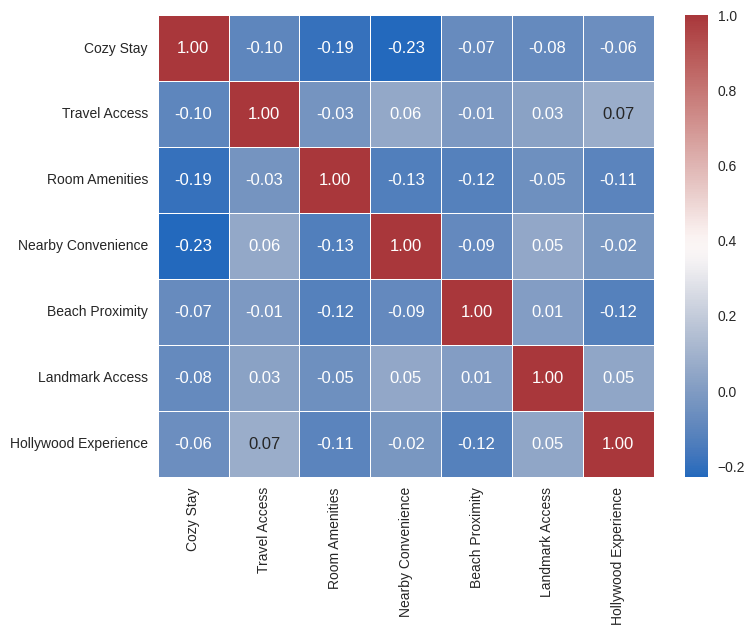

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
corr = cluster.drop('cluster_label',axis=1).corr(numeric_only=True)
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="vlag", fmt=".2f", linewidths=0.5)
plt.show()

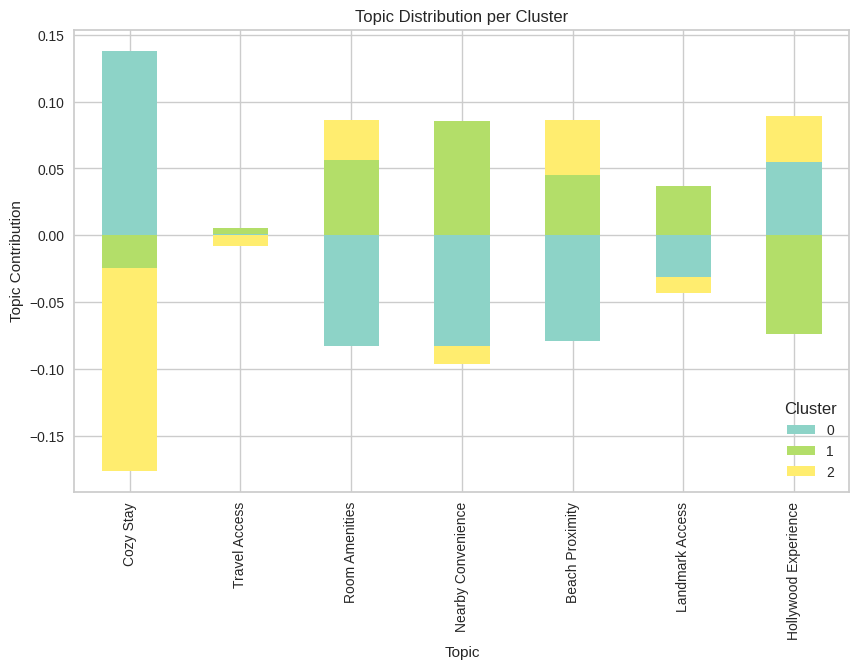

In [55]:
import numpy as np
topics = ['Cozy Stay', 'Travel Access', 'Room Amenities',
          'Nearby Convenience', 'Beach Proximity', 'Landmark Access', 'Hollywood Experience']
df_cluster_topics = cluster.groupby("cluster_label")[topics].mean()
df_cluster_topics.T.plot(kind="bar", stacked=True, figsize=(10, 6), cmap="Set3")
plt.ylabel("Topic Contribution")
plt.xlabel("Topic")
plt.title("Topic Distribution per Cluster")
plt.legend(title="Cluster")
plt.show()


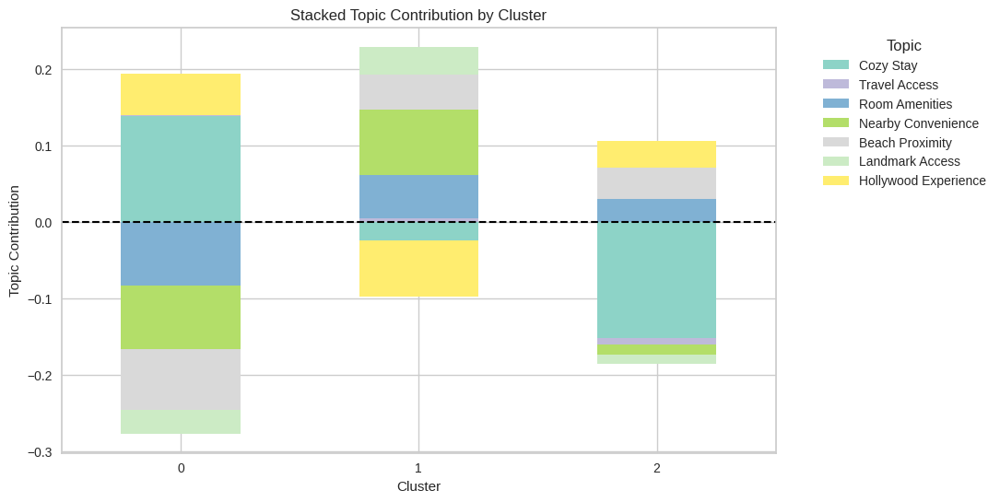

In [56]:
import matplotlib.pyplot as plt

df_cluster_topics.plot(kind="bar", stacked=True, figsize=(10, 6), cmap="Set3")
plt.axhline(y=0, color='black', linewidth=1.5, linestyle='--')
plt.ylabel("Topic Contribution")
plt.xlabel("Cluster")
plt.title("Stacked Topic Contribution by Cluster")
plt.xticks(rotation=0)
plt.legend(title="Topic", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()


In [57]:
import plotly.express as px

fig = px.scatter(
    cluster,
    x="Cozy Stay",
    y="Nearby Convenience",
    color="cluster_label",
    hover_name=cluster.index,
    title="2D Cluster Visualization",
    opacity=0.8
)
fig.update_traces(marker=dict(size=5))
fig.show()


In [58]:
import plotly.express as px

fig = px.scatter_3d(
    cluster,
    x="Cozy Stay",
    y="Room Amenities",
    z="Nearby Convenience",
    color="cluster_label",
    hover_name=cluster.index,
    title="3D Cluster Visualization",
    opacity=0.8
)
fig.update_traces(marker=dict(size=2))

fig.show()

In [59]:
import umap
import plotly.express as px

# Reduce dimensionality of topic distributions
umap_model = umap.UMAP(n_components=3, random_state=42)
embedding = umap_model.fit_transform(W)  # W is from NMF

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [60]:
df_umap = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2", "UMAP3"])
df_umap["Dominant Topic"] = W.argmax(axis=1)  # Assign most relevant topic

fig = px.scatter_3d(df_umap, x="UMAP1", y="UMAP2", z="UMAP3", color="Dominant Topic",
                 title="UMAP Projection of Topics", opacity=0.7)
fig.update_traces(marker=dict(size=2))
fig.show()